# Load

In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('/content/cs-training.csv')

In [3]:
df

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
149995,149996,0,0.040674,74,0,0.225131,2100.0,4,0,1,0,0.0
149996,149997,0,0.299745,44,0,0.716562,5584.0,4,0,1,0,2.0
149997,149998,0,0.246044,58,0,3870.000000,NaN,18,0,1,0,0.0
149998,149999,0,0.000000,30,0,0.000000,5716.0,4,0,0,0,0.0


In [4]:
df.describe()

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,1.202690e+05,150000.000000,150000.000000,150000.000000,150000.000000,146076.000000
mean,75000.500000,0.066840,6.048438,52.295207,0.421033,353.005076,6.670221e+03,8.452760,0.265973,1.018240,0.240387,0.757222
std,43301.414527,0.249746,249.755371,14.771866,4.192781,2037.818523,1.438467e+04,5.145951,4.169304,1.129771,4.155179,1.115086
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,37500.750000,0.000000,0.029867,41.000000,0.000000,0.175074,3.400000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,75000.500000,0.000000,0.154181,52.000000,0.000000,0.366508,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,112500.250000,0.000000,0.559046,63.000000,0.000000,0.868254,8.249000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
max,150000.000000,1.000000,50708.000000,109.000000,98.000000,329664.000000,3.008750e+06,58.000000,98.000000,54.000000,98.000000,20.000000


In [5]:
df.isna().sum()

,0
Unnamed: 0,0
SeriousDlqin2yrs,0
RevolvingUtilizationOfUnsecuredLines,0
age,0
NumberOfTime30-59DaysPastDueNotWorse,0
DebtRatio,0
MonthlyIncome,29731
NumberOfOpenCreditLinesAndLoans,0
NumberOfTimes90DaysLate,0
NumberRealEstateLoansOrLines,0


In [6]:
df['MonthlyIncome'].describe()

,MonthlyIncome
count,1.202690e+05
mean,6.670221e+03
std,1.438467e+04
min,0.000000e+00
25%,3.400000e+03
50%,5.400000e+03
75%,8.249000e+03
max,3.008750e+06


In [7]:
df.columns

Index(['Unnamed: 0', 'SeriousDlqin2yrs',
       'RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
       'NumberOfDependents'],
      dtype='object')

In [8]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# Eliminar columna de ID
df = df.drop(columns=[col for col in df.columns if col.lower().startswith('id') or col.startswith('Unnamed')])

# Separar X e y
target = 'SeriousDlqin2yrs'
X = df.drop(columns=[target])
y = df[target]

# Imputación y escalado
imputer = SimpleImputer(strategy='median')
scaler = StandardScaler()
X = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Modelos

## Logística

In [9]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import time

# División en train/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Inicializar modelo
logreg = LogisticRegression(max_iter=1000, solver='lbfgs')

# Entrenamiento con tiempo
start_time = time.time()
logreg.fit(X_train, y_train)
train_time = time.time() - start_time

# Predicciones
y_pred = logreg.predict(X_test)
y_proba = logreg.predict_proba(X_test)[:, 1]

# Métricas
metrics_logreg = {
    "Modelo": "Regresión Logística",
    "Accuracy": accuracy_score(y_test, y_pred),
    "Precision": precision_score(y_test, y_pred),
    "Recall": recall_score(y_test, y_pred),
    "F1-score": f1_score(y_test, y_pred),
    "ROC AUC": roc_auc_score(y_test, y_proba),
    "Tiempo (s)": train_time
}

# Mostrar resultados
resultados_modelos = pd.DataFrame([metrics_logreg])
print(resultados_modelos)

                Modelo  Accuracy  Precision    Recall  F1-score   ROC AUC  \
0  Regresión Logística     0.934   0.581699  0.044389  0.082484  0.714388   

   Tiempo (s)  
0    1.710653  


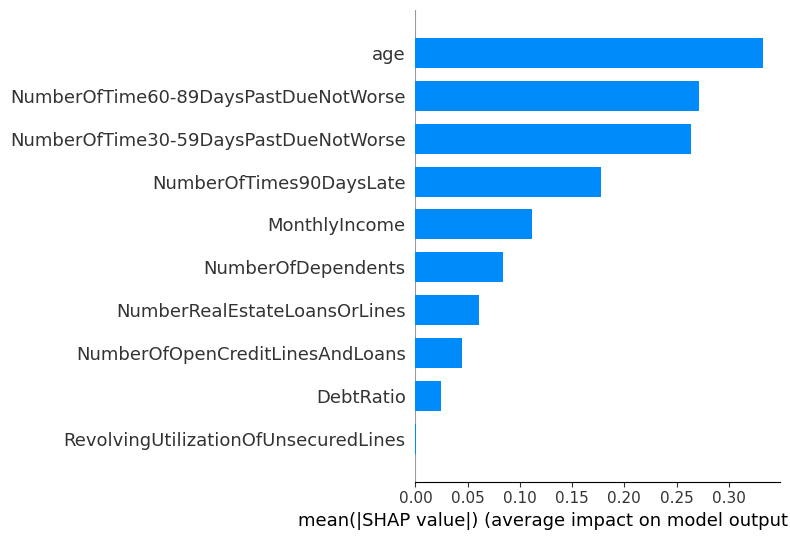

In [10]:
import shap
import matplotlib.pyplot

# Crear explainer
explainer_shap = shap.Explainer(logreg, X_test)

# Calcular valores SHAP
shap_values = explainer_shap(X_test)

# Resumen global (bar plot)
shap.summary_plot(shap_values, X_test, plot_type='bar')


In [11]:
pip install lime

In [12]:
import lime
import lime.lime_tabular

# Inicializar LIME
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns.tolist(),
    class_names=["No", "Sí"],
    mode='classification'
)

# Explicación de una observación (elige una aleatoria)
i = 10  # puedes cambiar este índice
exp = explainer_lime.explain_instance(
    data_row=X_test.iloc[i],
    predict_fn=logreg.predict_proba
)

# Mostrar en notebook
exp.show_in_notebook(show_table=True)


/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

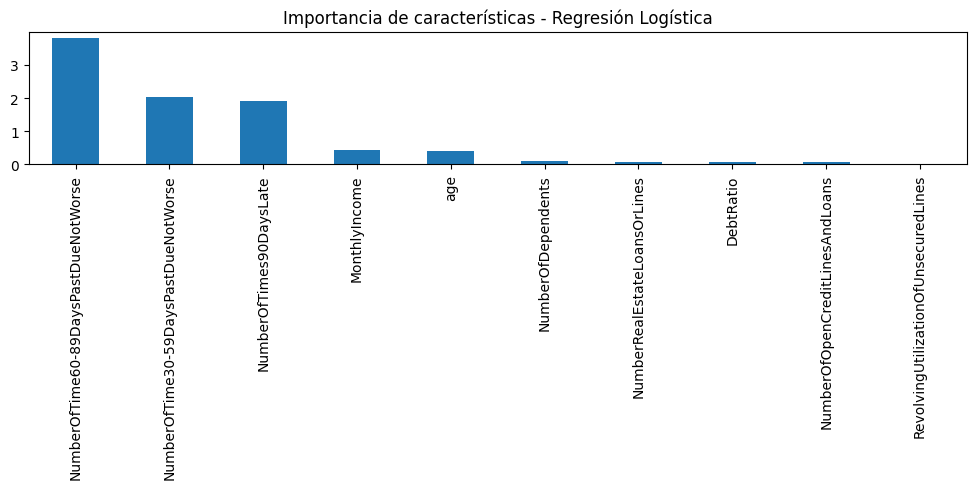

In [13]:
import matplotlib.pyplot as plt

# Obtener importancia de coeficientes
importancia = pd.Series(np.abs(logreg.coef_[0]), index=X.columns)
importancia.sort_values(ascending=False).plot(kind='bar', title="Importancia de características - Regresión Logística", figsize=(10,5))
plt.tight_layout()
plt.show()


In [14]:
# Crear DataFrame con coeficientes
coef_df = pd.DataFrame({
    'Variable': X.columns,
    'Coeficiente': logreg.coef_[0],
    'Exp(Coef)': np.exp(logreg.coef_[0])  # Odds ratio
}).sort_values(by='Coeficiente', key=abs, ascending=False)

# Mostrar los más relevantes
print(coef_df.head(10))


                               Variable  Coeficiente  Exp(Coef)
8  NumberOfTime60-89DaysPastDueNotWorse    -3.807680   0.022200
2  NumberOfTime30-59DaysPastDueNotWorse     2.042231   7.707784
6               NumberOfTimes90DaysLate     1.923652   6.845914
4                         MonthlyIncome    -0.423462   0.654776
1                                   age    -0.402946   0.668348
9                    NumberOfDependents     0.105237   1.110974
7          NumberRealEstateLoansOrLines     0.079981   1.083266
3                             DebtRatio    -0.074821   0.927909
5       NumberOfOpenCreditLinesAndLoans    -0.058532   0.943148
0  RevolvingUtilizationOfUnsecuredLines    -0.003391   0.996615


<ipython-input-15-2527482208>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=coef_df, y='Variable', x='Coeficiente', palette='coolwarm')


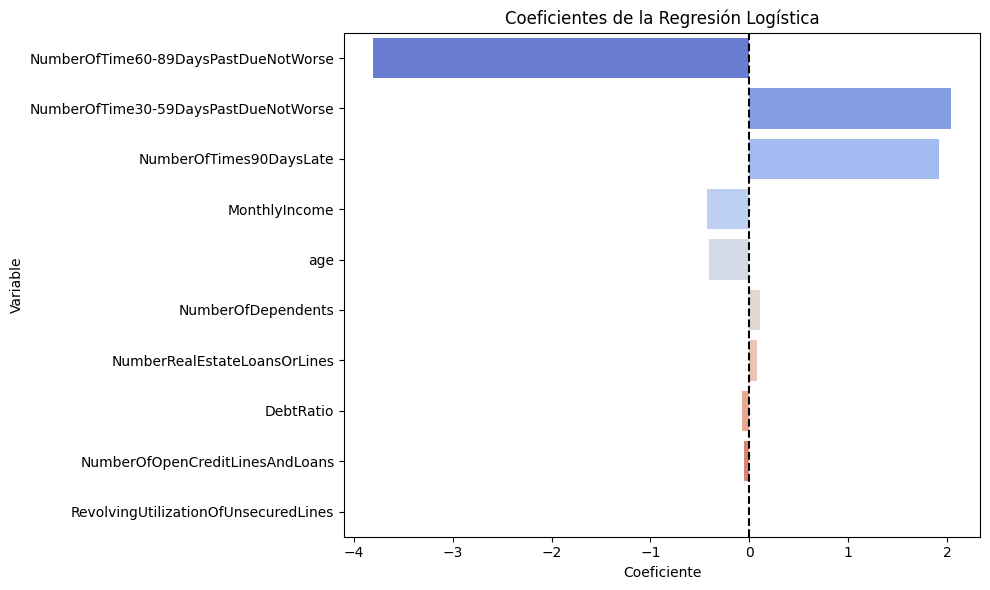

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.barplot(data=coef_df, y='Variable', x='Coeficiente', palette='coolwarm')
plt.title("Coeficientes de la Regresión Logística")
plt.axvline(0, color='black', linestyle='--')
plt.tight_layout()
plt.show()


## Arbol de decision

In [16]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import time

# Inicializar modelo
tree = DecisionTreeClassifier(max_depth=5, random_state=42)  # puedes ajustar el max_depth

# Entrenamiento
start = time.time()
tree.fit(X_train, y_train)
train_time = time.time() - start

# Predicción
y_pred_tree = tree.predict(X_test)
y_proba_tree = tree.predict_proba(X_test)[:, 1]

# Métricas
metrics_tree = {
    "Modelo": "Decision Tree",
    "Accuracy": accuracy_score(y_test, y_pred_tree),
    "Precision": precision_score(y_test, y_pred_tree),
    "Recall": recall_score(y_test, y_pred_tree),
    "F1-score": f1_score(y_test, y_pred_tree),
    "ROC AUC": roc_auc_score(y_test, y_proba_tree),
    "Tiempo (s)": train_time
}

# Añadir a resultados
resultados_modelos = pd.concat([resultados_modelos, pd.DataFrame([metrics_tree])], ignore_index=True)

# Ver tabla actualizada
print(resultados_modelos)


                Modelo  Accuracy  Precision    Recall  F1-score   ROC AUC  \
0  Regresión Logística  0.934000   0.581699  0.044389  0.082484  0.714388   
1        Decision Tree  0.936533   0.576399  0.190025  0.285821  0.845168   

   Tiempo (s)  
0    1.710653  
1    0.361765  


In [17]:
from sklearn.tree import plot_tree

plt.figure(figsize=(400, 200))
plot_tree(tree, feature_names=X.columns, class_names=["No", "Sí"], filled=True)
plt.title("Árbol de decisión")
plt.show()


In [18]:
import shap

# Explainer específico para árboles
explainer_tree = shap.TreeExplainer(tree)
shap_values_tree = explainer_tree.shap_values(X_test)

# Gráfico resumen
# shap.summary_plot(shap_values_tree[1], X_test, plot_type='bar')
# Esto genera el típico gráfico SHAP de dispersión
shap.summary_plot(shap_values_tree[1], X_test)



AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

<Figure size 640x480 with 0 Axes>

In [19]:
import lime
import lime.lime_tabular

# Inicializar LIME
explainer_lime_tree = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns.tolist(),
    class_names=["No", "Sí"],
    mode='classification'
)

# Explicación de una instancia
i = 7  # o cualquier otra
exp_tree = explainer_lime_tree.explain_instance(
    data_row=X_test.iloc[i],
    predict_fn=tree.predict_proba
)
exp_tree.show_in_notebook(show_table=True)


/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

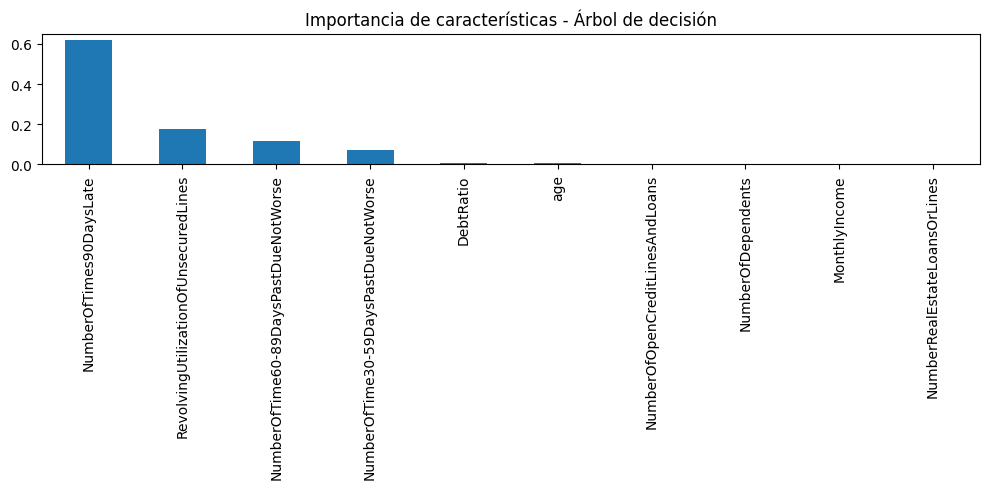

In [20]:
import matplotlib.pyplot as plt

importancia_tree = pd.Series(tree.feature_importances_, index=X.columns)
importancia_tree.sort_values(ascending=False).plot(kind='bar', title="Importancia de características - Árbol de decisión", figsize=(10,5))
plt.tight_layout()
plt.show()


## XGB

In [21]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import time

# Inicializar modelo con GPU
xgb_model = XGBClassifier(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='logloss',
    tree_method='gpu_hist',  # Usa GPU
    random_state=42
)

# Entrenamiento
start = time.time()
xgb_model.fit(X_train, y_train)
train_time = time.time() - start

# Predicción
y_pred_xgb = xgb_model.predict(X_test)
y_proba_xgb = xgb_model.predict_proba(X_test)[:, 1]

# Métricas
metrics_xgb = {
    "Modelo": "XGBoost",
    "Accuracy": accuracy_score(y_test, y_pred_xgb),
    "Precision": precision_score(y_test, y_pred_xgb),
    "Recall": recall_score(y_test, y_pred_xgb),
    "F1-score": f1_score(y_test, y_pred_xgb),
    "ROC AUC": roc_auc_score(y_test, y_proba_xgb),
    "Tiempo (s)": train_time
}

# Añadir a resultados
resultados_modelos = pd.concat([resultados_modelos, pd.DataFrame([metrics_xgb])], ignore_index=True)
print(resultados_modelos)


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:54:44] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:54:44] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


                Modelo  Accuracy  Precision    Recall  F1-score   ROC AUC  \
0  Regresión Logística  0.934000   0.581699  0.044389  0.082484  0.714388   
1        Decision Tree  0.936533   0.576399  0.190025  0.285821  0.845168   
2              XGBoost  0.937033   0.590343  0.189027  0.286362  0.868470   

   Tiempo (s)  
0    1.710653  
1    0.361765  
2    0.570566  


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:54:44] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:54:44] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)


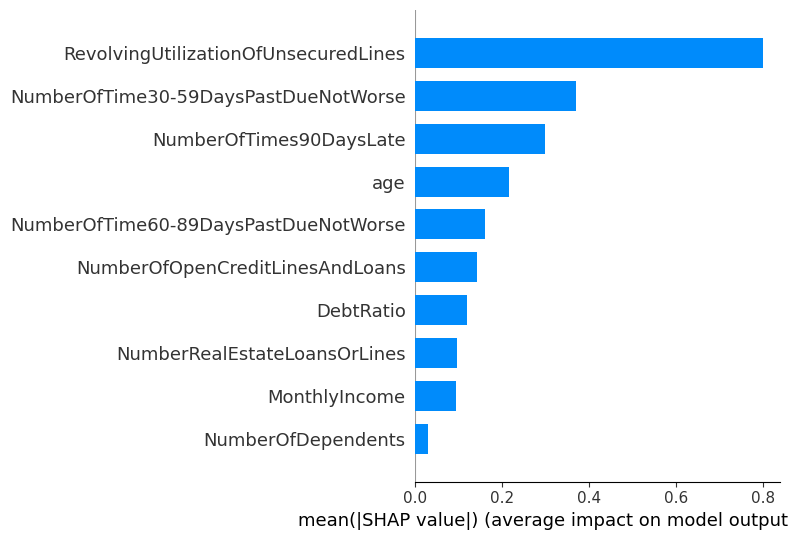

In [22]:
import shap

# TreeExplainer para XGBoost
explainer_xgb = shap.TreeExplainer(xgb_model)
shap_values_xgb = explainer_xgb.shap_values(X_test)

# Gráfico resumen
shap.summary_plot(shap_values_xgb, X_test, plot_type='bar')


In [23]:
import lime.lime_tabular

explainer_lime_xgb = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns.tolist(),
    class_names=["No", "Sí"],
    mode='classification'
)

# Elegir una instancia
i = 15
exp_xgb = explainer_lime_xgb.explain_instance(
    data_row=X_test.iloc[i],
    predict_fn=xgb_model.predict_proba
)

exp_xgb.show_in_notebook(show_table=True)


/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

<Figure size 1000x600 with 0 Axes>

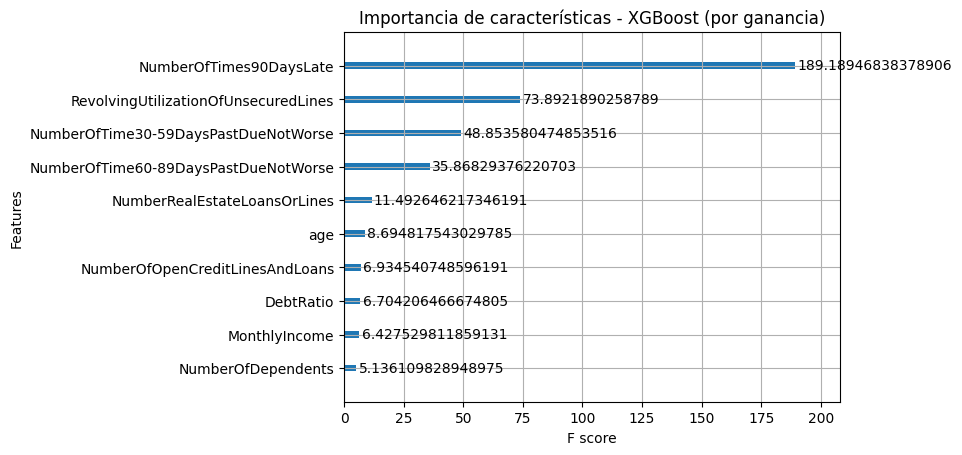

In [24]:
import matplotlib.pyplot as plt
from xgboost import plot_importance

plt.figure(figsize=(10, 6))
plot_importance(xgb_model, max_num_features=10, importance_type='gain')
plt.title("Importancia de características - XGBoost (por ganancia)")
plt.show()


## Redes neuronales

In [25]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import time


In [26]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [27]:
class MLP(nn.Module):
    def __init__(self, input_dim):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_dim, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 1)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return torch.sigmoid(self.fc3(x))


In [28]:
X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).view(-1, 1).to(device)
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1).to(device)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=256, shuffle=True)


In [29]:
model = MLP(input_dim=X_train.shape[1]).to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

start = time.time()
for epoch in range(20):  # número de epochs ajustable
    model.train()
    for xb, yb in train_loader:
        optimizer.zero_grad()
        pred = model(xb)
        loss = criterion(pred, yb)
        loss.backward()
        optimizer.step()
train_time = time.time() - start


In [30]:
model.eval()
with torch.no_grad():
    y_pred_proba_nn = model(X_test_tensor).cpu().numpy().flatten()
    y_pred_nn = (y_pred_proba_nn > 0.5).astype(int)

metrics_nn = {
    "Modelo": "Neural Network (PyTorch)",
    "Accuracy": accuracy_score(y_test, y_pred_nn),
    "Precision": precision_score(y_test, y_pred_nn),
    "Recall": recall_score(y_test, y_pred_nn),
    "F1-score": f1_score(y_test, y_pred_nn),
    "ROC AUC": roc_auc_score(y_test, y_pred_proba_nn),
    "Tiempo (s)": train_time
}

resultados_modelos = pd.concat([resultados_modelos, pd.DataFrame([metrics_nn])], ignore_index=True)
print(resultados_modelos)


                     Modelo  Accuracy  Precision    Recall  F1-score  \
0       Regresión Logística  0.934000   0.581699  0.044389  0.082484   
1             Decision Tree  0.936533   0.576399  0.190025  0.285821   
2                   XGBoost  0.937033   0.590343  0.189027  0.286362   
3  Neural Network (PyTorch)  0.936500   0.585324  0.171072  0.264763   

    ROC AUC  Tiempo (s)  
0  0.714388    1.710653  
1  0.845168    0.361765  
2  0.868470    0.570566  
3  0.838605   62.516562  


In [31]:
import shap

# Subconjunto para eficiencia
X_sample = X_test.sample(200)
X_sample_tensor = torch.tensor(X_sample.values, dtype=torch.float32).to(device)

# Crear explainer (modelo debe estar en modo eval)
model.eval()
explainer_nn = shap.GradientExplainer(model, X_sample_tensor)

# Calcular valores SHAP
shap_values_nn = explainer_nn.shap_values(X_sample_tensor)




In [32]:
# Visualización global por magnitud de contribución
shap.summary_plot(
    shap_values_nn[0],                 # valores SHAP para clase positiva
    X_sample.values,                   # datos originales
    feature_names=X.columns.tolist(), # nombres de columnas
    plot_type='bar'
)


<ipython-input-32-422985767>:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

<Figure size 640x480 with 0 Axes>

In [33]:
explainer_lime_nn = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns.tolist(),
    class_names=["No", "Sí"],
    mode='classification'
)

# Wrapper para predicción en NumPy
def predict_fn_nn(x_np):
    x_tensor = torch.tensor(x_np, dtype=torch.float32).to(device)
    with torch.no_grad():
        return model(x_tensor).cpu().numpy()

# Ejemplo
i = 12
exp_nn = explainer_lime_nn.explain_instance(
    data_row=X_test.iloc[i],
    predict_fn=predict_fn_nn
)
exp_nn.show_in_notebook(show_table=True)


/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

IndexError: index 1 is out of bounds for axis 1 with size 1

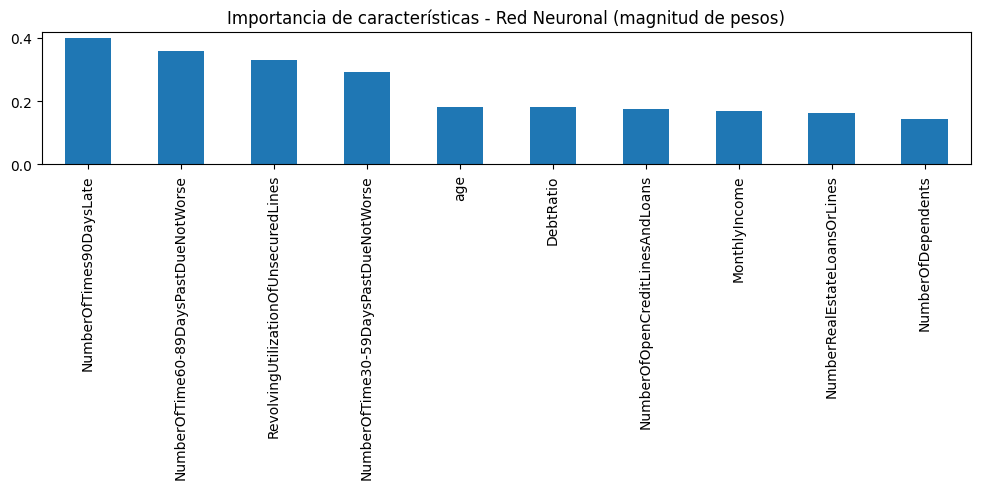

In [34]:
import matplotlib.pyplot as plt

# Mueve tensor completo a CPU primero
weights = model.fc1.weight.detach().cpu()

# Calcula magnitud media por variable
importances_nn = pd.Series(
    torch.abs(weights).mean(dim=0).numpy(),
    index=X.columns
)

importances_nn.sort_values(ascending=False).plot(
    kind='bar',
    title="Importancia de características - Red Neuronal (magnitud de pesos)",
    figsize=(10, 5)
)

plt.tight_layout()
plt.show()


# AUC-ROC

In [38]:
y_proba_logreg = logreg.predict_proba(X_test)[:, 1]
y_proba_tree = tree.predict_proba(X_test)[:, 1]
y_proba_xgb = xgb_model.predict_proba(X_test)[:, 1]
model.eval()
with torch.no_grad():
    y_proba_nn = model(X_test_tensor).cpu().numpy().flatten()



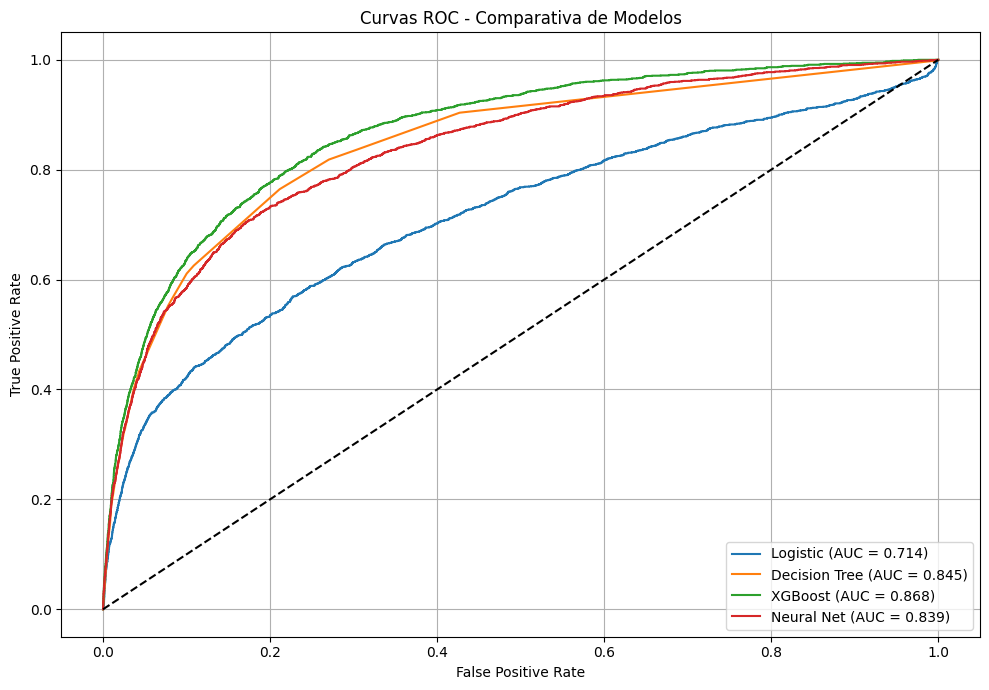

In [39]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Calcular curvas
fpr_logreg, tpr_logreg, _ = roc_curve(y_test, y_proba_logreg)
fpr_tree, tpr_tree, _ = roc_curve(y_test, y_proba_tree)
fpr_xgb, tpr_xgb, _ = roc_curve(y_test, y_proba_xgb)
fpr_nn, tpr_nn, _ = roc_curve(y_test, y_proba_nn)

# Calcular AUCs
auc_logreg = auc(fpr_logreg, tpr_logreg)
auc_tree = auc(fpr_tree, tpr_tree)
auc_xgb = auc(fpr_xgb, tpr_xgb)
auc_nn = auc(fpr_nn, tpr_nn)

# Plot
plt.figure(figsize=(10, 7))
plt.plot(fpr_logreg, tpr_logreg, label=f'Logistic (AUC = {auc_logreg:.3f})')
plt.plot(fpr_tree, tpr_tree, label=f'Decision Tree (AUC = {auc_tree:.3f})')
plt.plot(fpr_xgb, tpr_xgb, label=f'XGBoost (AUC = {auc_xgb:.3f})')
plt.plot(fpr_nn, tpr_nn, label=f'Neural Net (AUC = {auc_nn:.3f})')

# Diagonal
plt.plot([0, 1], [0, 1], 'k--')

# Estética
plt.title('Curvas ROC - Comparativa de Modelos')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()
